'model.config: '

FrozenDict([('sample_size', 256),
            ('in_channels', 3),
            ('out_channels', 3),
            ('center_input_sample', False),
            ('time_embedding_type', 'positional'),
            ('freq_shift', 1),
            ('flip_sin_to_cos', False),
            ('down_block_types',
             ['DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'AttnDownBlock2D',
              'DownBlock2D']),
            ('up_block_types',
             ['UpBlock2D',
              'AttnUpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D']),
            ('block_out_channels', [128, 128, 256, 256, 512, 512]),
            ('layers_per_block', 2),
            ('mid_block_scale_factor', 1),
            ('downsample_padding', 0),
            ('downsample_type', 'conv'),
            ('upsample_type', 'conv'),
            ('dropout', 0.0),
            ('act_fn', 'si

'scheduler.config: '

FrozenDict([('num_train_timesteps', 1000),
            ('beta_start', 0.0001),
            ('beta_end', 0.02),
            ('beta_schedule', 'linear'),
            ('trained_betas', None),
            ('variance_type', 'fixed_small'),
            ('clip_sample', True),
            ('prediction_type', 'epsilon'),
            ('thresholding', False),
            ('dynamic_thresholding_ratio', 0.995),
            ('clip_sample_range', 1.0),
            ('sample_max_value', 1.0),
            ('timestep_spacing', 'leading'),
            ('steps_offset', 0),
            ('rescale_betas_zero_snr', False),
            ('_use_default_values',
             ['rescale_betas_zero_snr',
              'steps_offset',
              'prediction_type',
              'sample_max_value',
              'timestep_spacing',
              'thresholding',
              'dynamic_thresholding_ratio',
              'clip_sample_range']),
            ('_class_name', 'DDPMScheduler'),
            ('_diffusers_versi

'Noisy sample shape: torch.Size([1, 3, 256, 256])'

  5%|▍         | 49/1000 [00:03<01:07, 14.18it/s]

'Image at step 50'

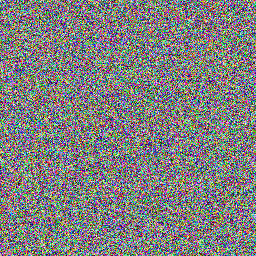

 10%|▉         | 99/1000 [00:07<01:03, 14.16it/s]

'Image at step 100'

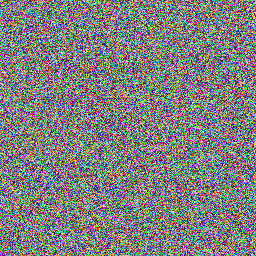

 15%|█▍        | 149/1000 [00:10<01:00, 14.15it/s]

'Image at step 150'

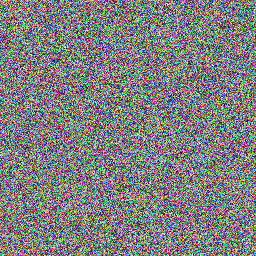

 20%|█▉        | 199/1000 [00:14<00:56, 14.12it/s]

'Image at step 200'

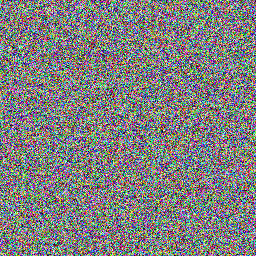

 25%|██▍       | 249/1000 [00:17<00:53, 14.09it/s]

'Image at step 250'

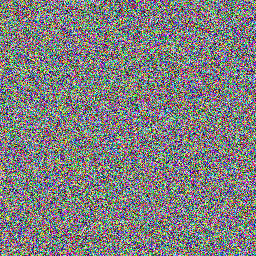

 30%|██▉       | 299/1000 [00:21<00:49, 14.14it/s]

'Image at step 300'

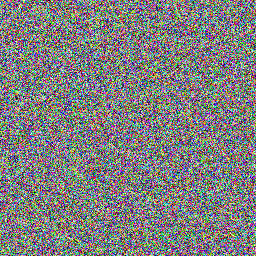

 35%|███▍      | 349/1000 [00:25<00:46, 13.94it/s]

'Image at step 350'

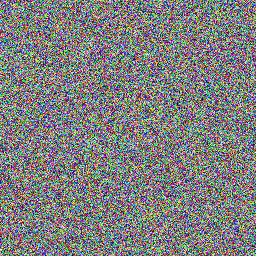

 40%|███▉      | 399/1000 [00:28<00:42, 14.22it/s]

'Image at step 400'

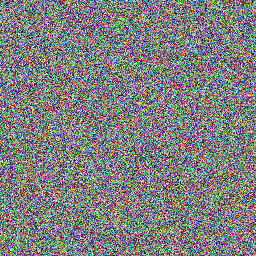

 45%|████▍     | 449/1000 [00:32<00:38, 14.19it/s]

'Image at step 450'

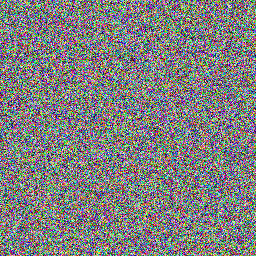

 50%|████▉     | 499/1000 [00:35<00:35, 14.07it/s]

'Image at step 500'

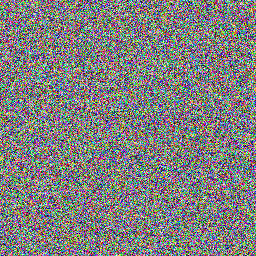

 55%|█████▍    | 549/1000 [00:39<00:31, 14.13it/s]

'Image at step 550'

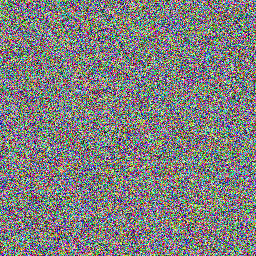

 60%|█████▉    | 599/1000 [00:42<00:28, 14.28it/s]

'Image at step 600'

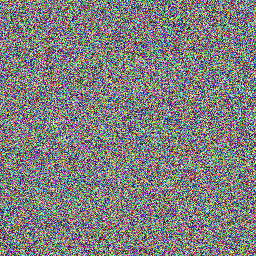

 65%|██████▍   | 649/1000 [00:46<00:24, 14.20it/s]

'Image at step 650'

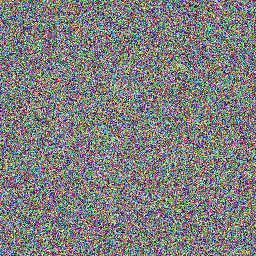

 70%|██████▉   | 699/1000 [00:49<00:21, 14.28it/s]

'Image at step 700'

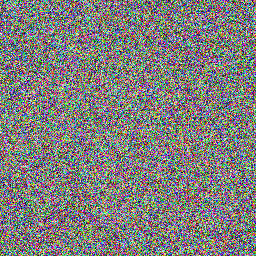

 75%|███████▍  | 749/1000 [00:53<00:17, 14.01it/s]

'Image at step 750'

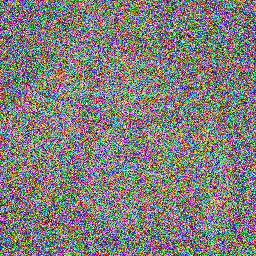

 80%|███████▉  | 799/1000 [00:57<00:14, 14.10it/s]

'Image at step 800'

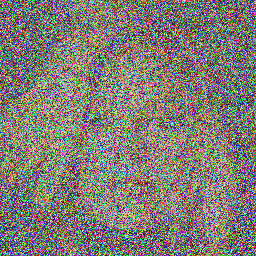

 85%|████████▍ | 849/1000 [01:00<00:10, 14.24it/s]

'Image at step 850'

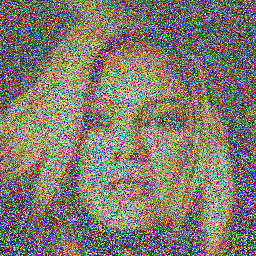

 90%|████████▉ | 899/1000 [01:04<00:07, 14.22it/s]

'Image at step 900'

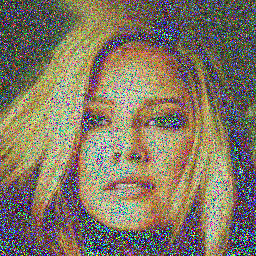

 95%|█████████▍| 949/1000 [01:07<00:03, 14.31it/s]

'Image at step 950'

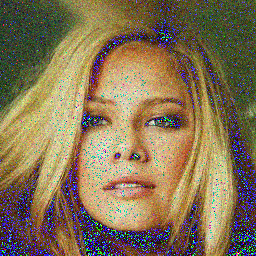

100%|█████████▉| 999/1000 [01:11<00:00, 14.00it/s]

'Image at step 1000'

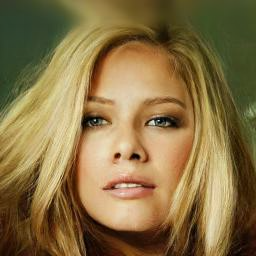

100%|██████████| 1000/1000 [01:11<00:00, 13.99it/s]


'Denoising complete.'

In [1]:
import torch
import numpy as np
import PIL.Image
from diffusers import UNet2DModel, DDPMScheduler
import tqdm
import time
import os

# 1. 初始化模型
# 選一個模型ID，用google的use_safetensors=False，用Mou11209203的use_safetensors=True
repo_id = "google/ddpm-celebahq-256"
repo_id1 = "Mou11209203/ddpm-celebahq-256"
model = UNet2DModel.from_pretrained(repo_id, use_safetensors=False)
model.to("cuda")  # 將模型移至 GPU
display("model.config: ", model.config)

# 2. 初始化調度器
scheduler = DDPMScheduler.from_pretrained(repo_id)
display("scheduler.config: ", scheduler.config)

# 3. 創建含高斯噪聲的圖片
# 使用固定或隨機種子，你自己決定
torch.manual_seed(1733783271)  # 1 固定隨機種子，保證可重現性
# seed = int(time.time())  # 2 使用當前時間作為隨機種子
# torch.manual_seed(seed)
noisy_sample = torch.randn(1, model.config.in_channels, model.config.sample_size, model.config.sample_size).to("cuda")
display(f"Noisy sample shape: {noisy_sample.shape}")

# 4. 定義顯示圖片的函數
def display_sample(sample, i):
    image_processed = sample.cpu().permute(0, 2, 3, 1)
    image_processed = (image_processed + 1.0) * 127.5
    image_processed = image_processed.numpy().astype(np.uint8)

    image_pil = PIL.Image.fromarray(image_processed[0])
    display(f"Image at step {i}")
    display(image_pil)

def save_sample(sample, i, output_dir="ddpm-celebahq-256"):
    # 檢查目錄是否存在，若不存在則創建
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # 處理圖像
    image_processed = sample.cpu().permute(0, 2, 3, 1)
    image_processed = (image_processed + 1.0) * 127.5
    image_processed = image_processed.numpy().astype(np.uint8)

    # 儲存圖片
    image_pil = PIL.Image.fromarray(image_processed[0])
    filename = f"{output_dir}/image_step_{i}.png"
    image_pil.save(filename)
    return filename

# 5. 逆擴散過程
sample = noisy_sample
for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
    # 1. 預測噪聲殘差
    with torch.no_grad():
        residual = model(sample, t).sample

    # 2. 計算較少噪聲的圖片，並將 x_t -> x_t-1
    sample = scheduler.step(residual, t, sample).prev_sample

    # 3. 選擇性顯示圖片（每 50 步顯示一次）
    if (i + 1) % 50 == 0:
        display_sample(sample, i + 1)
        save_sample(sample, i + 1, output_dir="ddpm-celebahq-256-DDPM")

display("Denoising complete.")

'scheduler_PNDM.config: '

FrozenDict([('num_train_timesteps', 1000),
            ('beta_start', 0.0001),
            ('beta_end', 0.02),
            ('beta_schedule', 'linear'),
            ('trained_betas', None),
            ('skip_prk_steps', False),
            ('set_alpha_to_one', False),
            ('prediction_type', 'epsilon'),
            ('timestep_spacing', 'leading'),
            ('steps_offset', 0),
            ('_use_default_values',
             ['steps_offset',
              'prediction_type',
              'timestep_spacing',
              'set_alpha_to_one',
              'skip_prk_steps']),
            ('variance_type', 'fixed_small'),
            ('clip_sample', True),
            ('_class_name', 'PNDMScheduler'),
            ('_diffusers_version', '0.1.1')])

  5%|▍         | 48/1009 [00:03<01:09, 13.84it/s]

'Image at step 50'

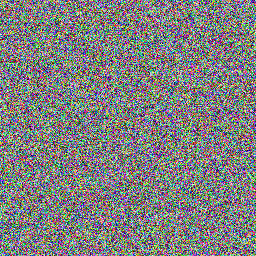

 10%|▉         | 98/1009 [00:07<01:05, 13.88it/s]

'Image at step 100'

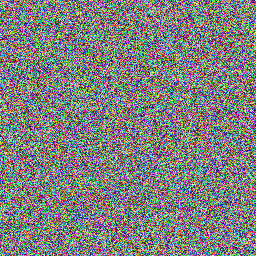

 15%|█▍        | 149/1009 [00:10<01:01, 13.95it/s]

'Image at step 150'

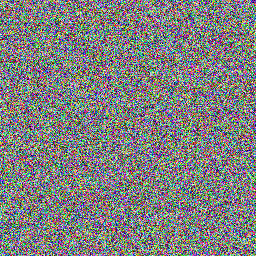

 20%|█▉        | 199/1009 [00:14<00:57, 14.01it/s]

'Image at step 200'

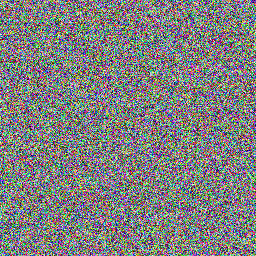

 25%|██▍       | 249/1009 [00:17<00:54, 13.86it/s]

'Image at step 250'

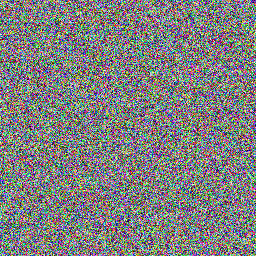

 30%|██▉       | 299/1009 [00:21<00:50, 14.03it/s]

'Image at step 300'

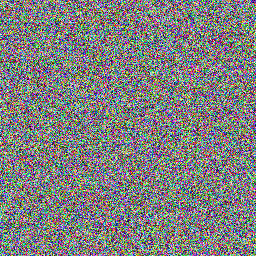

 35%|███▍      | 349/1009 [00:25<00:47, 13.83it/s]

'Image at step 350'

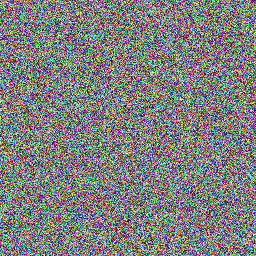

 40%|███▉      | 399/1009 [00:28<00:43, 13.94it/s]

'Image at step 400'

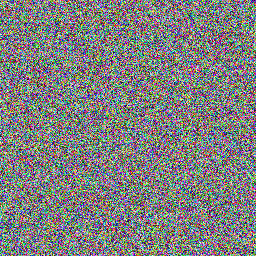

 44%|████▍     | 449/1009 [00:32<00:39, 14.14it/s]

'Image at step 450'

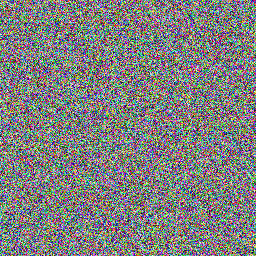

 49%|████▉     | 499/1009 [00:35<00:36, 13.95it/s]

'Image at step 500'

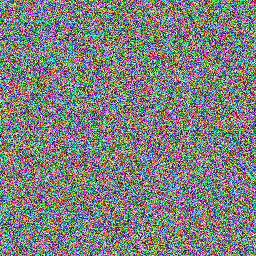

 54%|█████▍    | 549/1009 [00:39<00:32, 14.13it/s]

'Image at step 550'

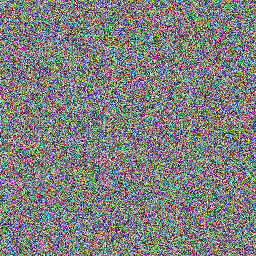

 59%|█████▉    | 599/1009 [00:43<00:29, 13.88it/s]

'Image at step 600'

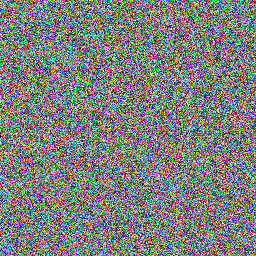

 64%|██████▍   | 649/1009 [00:46<00:25, 13.86it/s]

'Image at step 650'

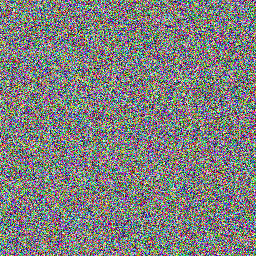

 69%|██████▉   | 699/1009 [00:50<00:22, 13.94it/s]

'Image at step 700'

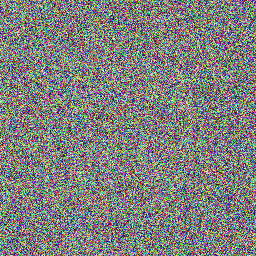

 74%|███████▍  | 749/1009 [00:54<00:18, 13.87it/s]

'Image at step 750'

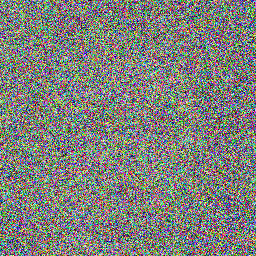

 79%|███████▉  | 799/1009 [00:57<00:14, 14.13it/s]

'Image at step 800'

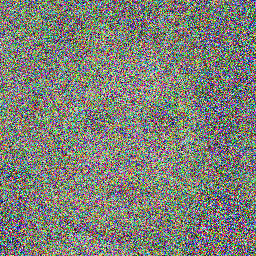

 84%|████████▍ | 849/1009 [01:01<00:11, 14.13it/s]

'Image at step 850'

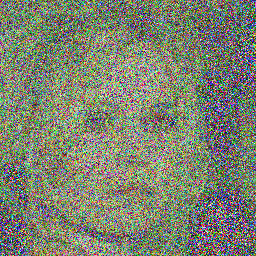

 89%|████████▉ | 899/1009 [01:04<00:07, 14.03it/s]

'Image at step 900'

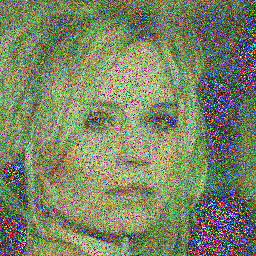

 94%|█████████▍| 949/1009 [01:08<00:04, 13.81it/s]

'Image at step 950'

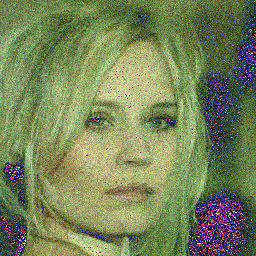

 99%|█████████▉| 999/1009 [01:12<00:00, 13.96it/s]

'Image at step 1000'

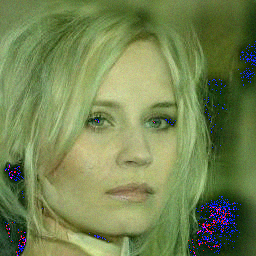

100%|██████████| 1009/1009 [01:12<00:00, 13.87it/s]


'Denoising complete.'

In [2]:
from diffusers import PNDMScheduler
# 2. 初始化調度器
scheduler_PNDM = PNDMScheduler.from_pretrained(repo_id1)
display("scheduler_PNDM.config: ", scheduler_PNDM.config)
scheduler_PNDM.set_timesteps(1000)  # 設置總步數，通常為 1000

# 5. 逆擴散過程
sample = noisy_sample
for i, t in enumerate(tqdm.tqdm(scheduler_PNDM.timesteps)):
    # 1. 預測噪聲殘差
    with torch.no_grad():
        residual = model(sample, t).sample

    # 2. 計算較少噪聲的圖片，並將 x_t -> x_t-1
    sample = scheduler_PNDM.step(residual, t, sample).prev_sample

    # 3. 選擇性顯示圖片（每 50 步顯示一次）
    if (i + 1) % 50 == 0:
        display_sample(sample, i + 1)
        save_sample(sample, i + 1, output_dir="ddpm-celebahq-256-PNDM")

display("Denoising complete.")

'scheduler_DPMSMS.config: '

FrozenDict([('num_train_timesteps', 1000),
            ('beta_start', 0.0001),
            ('beta_end', 0.02),
            ('beta_schedule', 'linear'),
            ('trained_betas', None),
            ('solver_order', 2),
            ('prediction_type', 'epsilon'),
            ('thresholding', False),
            ('dynamic_thresholding_ratio', 0.995),
            ('sample_max_value', 1.0),
            ('algorithm_type', 'dpmsolver++'),
            ('solver_type', 'midpoint'),
            ('lower_order_final', True),
            ('euler_at_final', False),
            ('use_karras_sigmas', False),
            ('use_exponential_sigmas', False),
            ('use_beta_sigmas', False),
            ('use_lu_lambdas', False),
            ('final_sigmas_type', 'zero'),
            ('lambda_min_clipped', -inf),
            ('variance_type', 'fixed_small'),
            ('timestep_spacing', 'linspace'),
            ('steps_offset', 0),
            ('rescale_betas_zero_snr', False),
            ('

 49%|████▉     | 49/100 [00:03<00:03, 13.84it/s]

'Image at step 50'

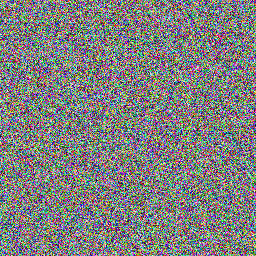

 99%|█████████▉| 99/100 [00:07<00:00, 14.01it/s]

'Image at step 100'

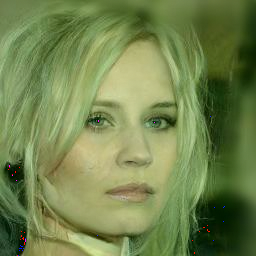

100%|██████████| 100/100 [00:07<00:00, 13.80it/s]


In [3]:
from diffusers import DPMSolverMultistepScheduler
# 2. 初始化調度器
scheduler_DPMSMS = DPMSolverMultistepScheduler.from_pretrained(repo_id1)
display("scheduler_DPMSMS.config: ", scheduler_DPMSMS.config)
scheduler_DPMSMS.set_timesteps(100)  # 設置總步數，通常為 1000

# 5. 逆擴散過程
sample = noisy_sample
for i, t in enumerate(tqdm.tqdm(scheduler_DPMSMS.timesteps)):
    # 1. 預測噪聲殘差
    with torch.no_grad():
        residual = model(sample, t).sample

    # 2. 計算較少噪聲的圖片，並將 x_t -> x_t-1
    sample = scheduler_DPMSMS.step(residual, t, sample).prev_sample

    # 3. 選擇性顯示圖片（每 50 步顯示一次）
    if (i + 1) % 50 == 0:
        display_sample(sample, i + 1)
        save_sample(sample, i + 1, output_dir="ddpm-celebahq-256-DPMSMS")


'scheduler_DDIM.config: '

FrozenDict([('num_train_timesteps', 1000),
            ('beta_start', 0.0001),
            ('beta_end', 0.02),
            ('beta_schedule', 'linear'),
            ('trained_betas', None),
            ('clip_sample', True),
            ('set_alpha_to_one', True),
            ('steps_offset', 0),
            ('prediction_type', 'epsilon'),
            ('thresholding', False),
            ('dynamic_thresholding_ratio', 0.995),
            ('clip_sample_range', 1.0),
            ('sample_max_value', 1.0),
            ('timestep_spacing', 'leading'),
            ('rescale_betas_zero_snr', False),
            ('_use_default_values',
             ['rescale_betas_zero_snr',
              'steps_offset',
              'prediction_type',
              'sample_max_value',
              'timestep_spacing',
              'thresholding',
              'set_alpha_to_one',
              'dynamic_thresholding_ratio',
              'clip_sample_range']),
            ('variance_type', 'fixed_small'),
  

  5%|▍         | 49/1000 [00:03<01:08, 13.90it/s]

'Image at step 50'

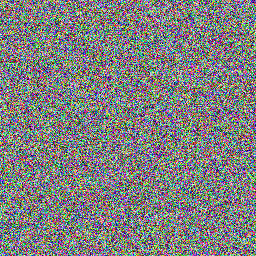

 10%|▉         | 99/1000 [00:07<01:04, 14.07it/s]

'Image at step 100'

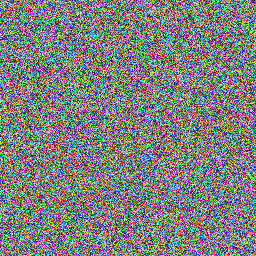

 15%|█▍        | 149/1000 [00:10<01:00, 14.12it/s]

'Image at step 150'

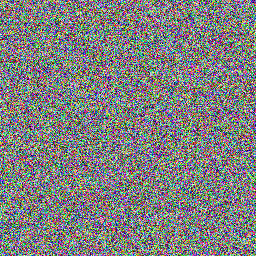

 20%|█▉        | 199/1000 [00:14<00:57, 14.03it/s]

'Image at step 200'

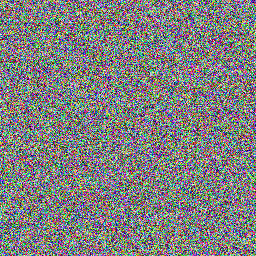

 25%|██▍       | 249/1000 [00:17<00:53, 13.99it/s]

'Image at step 250'

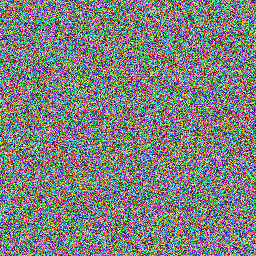

 30%|██▉       | 299/1000 [00:21<00:49, 14.05it/s]

'Image at step 300'

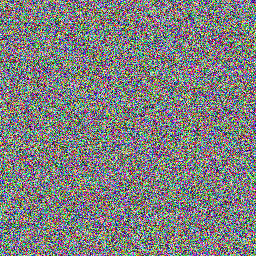

 35%|███▍      | 349/1000 [00:24<00:46, 13.90it/s]

'Image at step 350'

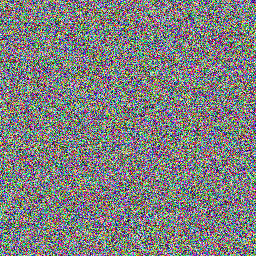

 40%|███▉      | 399/1000 [00:28<00:42, 14.04it/s]

'Image at step 400'

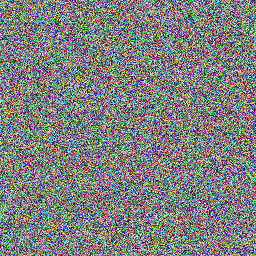

 45%|████▍     | 449/1000 [00:32<00:38, 14.19it/s]

'Image at step 450'

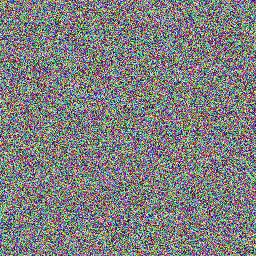

 50%|████▉     | 499/1000 [00:35<00:35, 14.18it/s]

'Image at step 500'

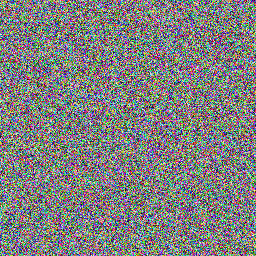

 55%|█████▍    | 549/1000 [00:39<00:31, 14.19it/s]

'Image at step 550'

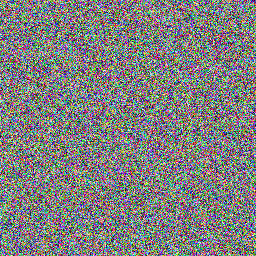

 60%|█████▉    | 599/1000 [00:42<00:28, 14.13it/s]

'Image at step 600'

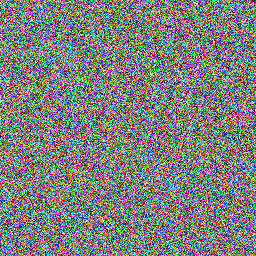

 65%|██████▍   | 649/1000 [00:46<00:25, 13.73it/s]

'Image at step 650'

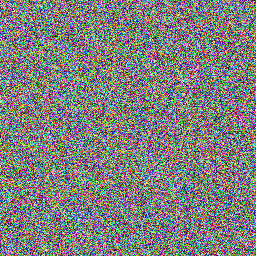

 70%|██████▉   | 699/1000 [00:50<00:21, 14.17it/s]

'Image at step 700'

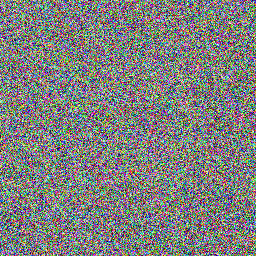

 75%|███████▍  | 749/1000 [00:53<00:17, 14.00it/s]

'Image at step 750'

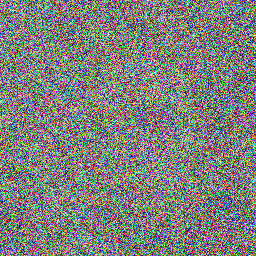

 80%|███████▉  | 799/1000 [00:57<00:14, 14.24it/s]

'Image at step 800'

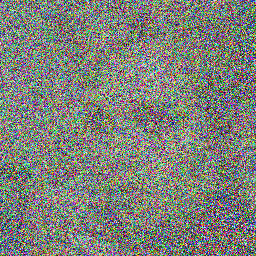

 85%|████████▍ | 849/1000 [01:00<00:10, 13.99it/s]

'Image at step 850'

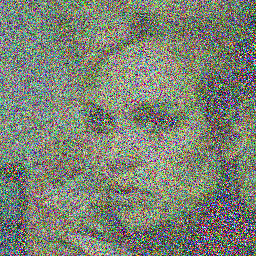

 90%|████████▉ | 899/1000 [01:04<00:07, 14.24it/s]

'Image at step 900'

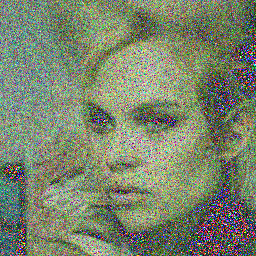

 95%|█████████▍| 949/1000 [01:07<00:03, 14.28it/s]

'Image at step 950'

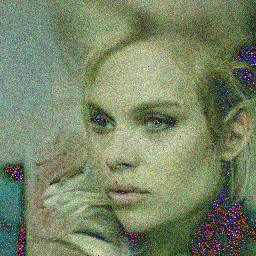

100%|█████████▉| 999/1000 [01:11<00:00, 14.22it/s]

'Image at step 1000'

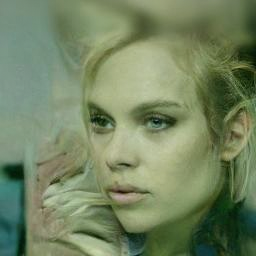

100%|██████████| 1000/1000 [01:11<00:00, 13.97it/s]


'Denoising complete.'

In [4]:
from diffusers import DDIMScheduler
# 2. 初始化調度器
scheduler_DDIM = DDIMScheduler.from_pretrained(repo_id1)
display("scheduler_DDIM.config: ", scheduler_DDIM.config)
scheduler_DDIM.set_timesteps(1000)  # 設置總步數，通常為 1000

# 5. 逆擴散過程
sample = noisy_sample
for i, t in enumerate(tqdm.tqdm(scheduler_DDIM.timesteps)):
    # 1. 預測噪聲殘差
    with torch.no_grad():
        residual = model(sample, t).sample

    # 2. 計算較少噪聲的圖片，並將 x_t -> x_t-1
    sample = scheduler_DDIM.step(residual, t, sample).prev_sample

    # 3. 選擇性顯示圖片（每 50 步顯示一次）
    if (i + 1) % 50 == 0:
        display_sample(sample, i + 1)
        save_sample(sample, i + 1, output_dir="ddpm-celebahq-256-DDIM")

display("Denoising complete.")